# Dog races detection with CNNs and Transfer Learning

[Git repository](https://github.com/thibaudgrosjean/Whatadog) of this project.

# Introduction

In this project, we will use *Tensoflow ([Keras](https://keras.io/))* to implement and train *machine learning* algorithms to automatically detect *dog races* in pictures. 

To solve this problematic, we will create a *CNN (Convulotionnal Neural Network)* from scratch, and *fine-tune pre-trained models* thanks to *transfer learning*. We will use *KerasTuner* for the hyperparameters search and *Tensorboard* to track the *results*.

The *training data* used in this notebook is the [*Standford Dogs Dataset*](http://vision.stanford.edu/aditya86/ImageNetDogs/).

# Environment

Import libraries:

In [1]:
# import plotly
import copy
import pandas as pd
import numpy as np
import random
import tensorboard
from mat4py import loadmat
from IPython.display import Image
import datetime
from PIL import Image
import plotly.express as px
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16, InceptionV3
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import img_to_array, load_img
from tensorflow.keras import backend as K
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.inception_v3 import preprocess_input
import tensorflow_addons as tfa
from tensorflow.python.summary.summary_iterator import summary_iterator
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.utils import shuffle
import keras_tuner as kt
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

Delete the *(previous) TensorBoard* logs:

In [2]:
# Clear any logs from previous runs
! rm -rf cnn_log
! rm -rf vgg_log
! rm -rf inception_log
! rm -rf inception_120_log
! rm -rf untitled_project
# Load the TensorBoard notebook extension
%load_ext tensorboard

# Seeds

* *For reproductibility:*

In [3]:
seed = 999
np.random.seed(seed)
tf.random.set_seed(seed)
random.seed(seed)

# Meta Data

In order to obtain the file paths for our training and testing dataset, we use the meta data and open the *file lists* with *loadmat*:

In [4]:
# Load meta data
train_df_init = pd.DataFrame(loadmat('./data/lists/train_list.mat'))
val_df_init = pd.DataFrame(loadmat('./data/lists/test_list.mat'))
train_df_init.shape, val_df_init.shape

((12000, 3), (8580, 3))

We obtain a dataset composed of 12000 *training samples* and 8580 *test samples*.

We format the data (*which is encapsulated in lists following our file opening*) in order to use it:

In [5]:
# Clean dataframe
train_df_init = train_df_init.applymap(lambda x: x[0])
val_df_init = val_df_init.applymap(lambda x: x[0])
train_df_init.head()

,file_list,annotation_list,labels
0,n02085620-Chihuahua/n02085620_5927.jpg,n02085620-Chihuahua/n02085620_5927,1
1,n02085620-Chihuahua/n02085620_4441.jpg,n02085620-Chihuahua/n02085620_4441,1
2,n02085620-Chihuahua/n02085620_1502.jpg,n02085620-Chihuahua/n02085620_1502,1
3,n02085620-Chihuahua/n02085620_1916.jpg,n02085620-Chihuahua/n02085620_1916,1
4,n02085620-Chihuahua/n02085620_13151.jpg,n02085620-Chihuahua/n02085620_13151,1


The *meta data* contains:
* A *file list*: paths that point to the *image files*,
* An *annotation list*: paths that point the image *annotation files*.
* *labels* which correspond to one the 120 the dog races present in the dataset.

We start by extracting the human readable labels from the *file_list* feature:

In [6]:
train_df_init['label'] = train_df_init['file_list'].apply(lambda x: x.split('/')[0].split('-')[1].replace('_', ' ').capitalize())
val_df_init['label'] = val_df_init['file_list'].apply(lambda x: x.split('/')[0].split('-')[1].replace('_', ' ').capitalize())
train_df_init.head()

,file_list,annotation_list,labels,label
0,n02085620-Chihuahua/n02085620_5927.jpg,n02085620-Chihuahua/n02085620_5927,1,Chihuahua
1,n02085620-Chihuahua/n02085620_4441.jpg,n02085620-Chihuahua/n02085620_4441,1,Chihuahua
2,n02085620-Chihuahua/n02085620_1502.jpg,n02085620-Chihuahua/n02085620_1502,1,Chihuahua
3,n02085620-Chihuahua/n02085620_1916.jpg,n02085620-Chihuahua/n02085620_1916,1,Chihuahua
4,n02085620-Chihuahua/n02085620_13151.jpg,n02085620-Chihuahua/n02085620_13151,1,Chihuahua


# Explore Data

We explore the whole *dataset*, in order to achieve this, we first concat the *training set* to the *test set*:

In [7]:
train_df_init['Set'] = 'Training'
val_df_init['Set'] = 'Validation'
dataset_df = pd.concat([train_df_init, val_df_init], axis=0)
dataset_df

,file_list,annotation_list,labels,label,Set
0,n02085620-Chihuahua/n02085620_5927.jpg,n02085620-Chihuahua/n02085620_5927,1,Chihuahua,Training
1,n02085620-Chihuahua/n02085620_4441.jpg,n02085620-Chihuahua/n02085620_4441,1,Chihuahua,Training
2,n02085620-Chihuahua/n02085620_1502.jpg,n02085620-Chihuahua/n02085620_1502,1,Chihuahua,Training
3,n02085620-Chihuahua/n02085620_1916.jpg,n02085620-Chihuahua/n02085620_1916,1,Chihuahua,Training
4,n02085620-Chihuahua/n02085620_13151.jpg,n02085620-Chihuahua/n02085620_13151,1,Chihuahua,Training
...,...,...,...,...,...
8575,n02116738-African_hunting_dog/n02116738_4991.jpg,n02116738-African_hunting_dog/n02116738_4991,120,African hunting dog,Validation
8576,n02116738-African_hunting_dog/n02116738_3024.jpg,n02116738-African_hunting_dog/n02116738_3024,120,African hunting dog,Validation
8577,n02116738-African_hunting_dog/n02116738_3635.jpg,n02116738-African_hunting_dog/n02116738_3635,120,African hunting dog,Validation
8578,n02116738-African_hunting_dog/n02116738_2988.jpg,n02116738-African_hunting_dog/n02116738_2988,120,African hunting dog,Validation


We apply a *groupby* on the dataset in order to plot the labels repartition:

In [8]:
grouped_dataset = dataset_df.groupby(['label', 'Set']).agg(
    Count=('label', len))
grouped_dataset.reset_index(inplace=True)
grouped_dataset.head()

,label,Set,Count
0,Affenpinscher,Training,100
1,Affenpinscher,Validation,50
2,Afghan hound,Training,100
3,Afghan hound,Validation,139
4,African hunting dog,Training,100


We use *plotly* to plot the *datasets* composition:

In [9]:
fig = px.bar(grouped_dataset, x='label', y='Count', color='Set', title='Dataset Composition', height=750)
fig.show()

We observe that the *validation set* is imbalanced.

# Filter Data

Being limited in *processing power*, we filter our dataset in order to keep a *subset* of the *firsts n (3) classes (N_CLASSES)*:

In [10]:
# Extract first n labels
N_CLASSES = 3


def get_n_classes(train_df, val_df, n_classes):

    train_df = shuffle(train_df[train_df['labels'] <= n_classes])
    val_df = shuffle(val_df[val_df['labels'] <= n_classes])

    return train_df, val_df


# We apply the g_n_classes
train_df, val_df = get_n_classes(train_df_init, val_df_init, N_CLASSES)
train_df.shape, val_df.shape

((300, 5), (289, 5))

We print a *random sample* image:

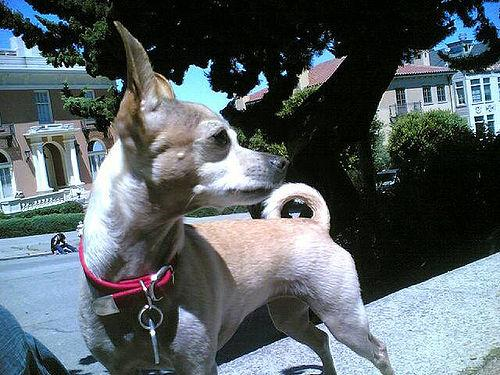

In [11]:
images_path = './data/Images/'

def get_sample(df):
    # Get a random sample
    sample = df.sample(1)
    sample_path = images_path + sample['file_list'].values[0]
    sample_img = Image.open(sample_path)

    return sample, sample_img, sample_path

sample, sample_img, sample_path = get_sample(train_df)
sample_img

# Process Data

## Data Augmentation

In order to experiment with the *processing & augmentation* tools of *Keras*, we have developed a function to show the various transformations:

In [12]:
def show_transformations(sample_path, datagen_settings, n_examples=3):

    sim_generator = ImageDataGenerator(**datagen_settings)

    img = load_img(sample_path)  # this is a PIL image
    x = img_to_array(img)  # this is a Numpy array with shape (3, 150, 150)
    x = x.reshape((1,) + x.shape)  # this is a Numpy array with shape (1, 3, 150, 150)
    fig = plt.figure(figsize=(25,25))
    plt.subplot(1,4,1)
    plt.title('Original')
    plt.imshow(img)
    plt.axis('off')

    sim_generator.fit(x)
    
    i = 0
    for img in sim_generator.flow(x, batch_size=1):
        plt.subplot(1,4,i+2)
        plt.title(f'Augmented')
        plt.imshow(img[0])
        plt.axis('off')
        i += 1
        if i == n_examples :
            break

The various parameters of the *ImageDataGenerator* are described [here](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator).

By passing the wanted *datagen augmentation settings (as a dictionary)* to the *show_transformation()* function, we can observe the *randomly generated samples*:

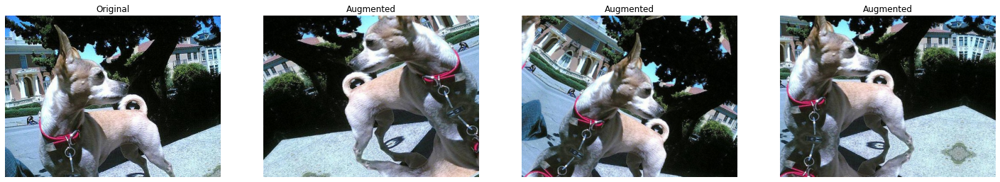

In [13]:
augmentation_settings = dict(
        rescale=1./255.,
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='reflect')

show_transformations(
    sample_path=sample_path,
    datagen_settings=augmentation_settings)

By passing the wanted *datagen processing settings (as a dictionary)* to the *show_transformation()* function, we can observe the *randomly generated samples* and limit the output of the function using the *n_examples* parameter:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


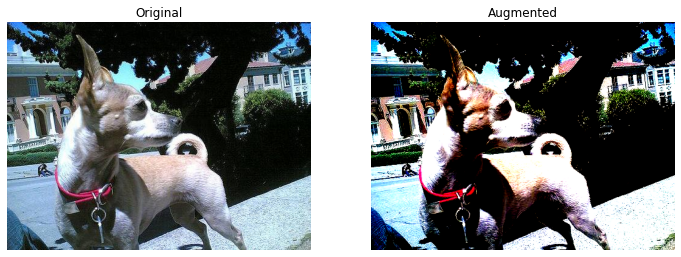

In [14]:
processing_settings = dict(
        rescale=1./255.,
        featurewise_center=True,
        featurewise_std_normalization=True)

show_transformations(
    sample_path=sample_path,
    datagen_settings=processing_settings,
    n_examples=1)

## Preprocessing

Now that we have experimented with the *image processing* and *augmentation* and obtained adequate *parameters*, we will apply these *parameters* on the whole *dataset* in order to train our models.

By using the *flow_from_dataframe* method of the *KerasImageGenerator class*, we will iterate over our *training and testing meta data* to generate *on the fly enhanced and augmented data* to pass to our *model* by *batch*: the *KerasImageGenerator class* is a *python generator*.

* We first format the *dtype* of the *labels* in order to be able to pass it to the *class*:

In [15]:
# Set labels dtype for the generator
# train_df['labels'] = train_df['labels'].astype(str)
# val_df['labels'] = val_df['labels'].astype(str)

The *ImageDataGenerator class* has a few drawbacks, including that it is required to first train the *generator* on a *numpy array* containing the images *raw data* before being able to use it to transform the *training data* with tools such as the *standardization*.

* In order to avoid developing a *loop* that would extract the *raw data* from the data directory and only use the *ImageDataGenerator*, we have found a solution that consist of creating a *ImageDataGenerator* with the following *standardize method*:

In [16]:
# https://github.com/keras-team/keras/issues/7218#issuecomment-313364140
class FittedImageDataGenerator(ImageDataGenerator):
    def standardize(self, x):
        if self.featurewise_center:
            x = ((x/255.) - 0.5) * 2.
        return x

*VGG16* is a reknown and standard model in the field of Computer Vision (and one the the algorithms that we will try out in this *notebook*), it was trained with 224x224 pictures, therefore, we are rescaling the dataset pictures to this resolution.

* We initialize our *final settings* as the *datagen_settings dictionary*:

In [17]:
# Define settings for augmentation
datagen_settings = processing_settings | augmentation_settings

train_datagen = FittedImageDataGenerator(**datagen_settings)
val_datagen = ImageDataGenerator(rescale=1./255.)

We initialize 2 different *generators*: one for the *training set* & one for the *testing set*, in order to avoid *data leak*. 

* We have separate *datasets* for the *training & testing sets*, we therefore do not use a single *generator* nor the *split method* of the *Keras class*:

In [18]:
# Define arguments for both generators
output_dimensions = (224,224)
batch_size = 64
generator_settings = dict(
    directory=images_path,
    x_col='file_list',
    y_col='label',
    class_mode='categorical',
    target_size=output_dimensions,
    batch_size=batch_size)

train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    **generator_settings,
    seed=seed)
val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_df,
    **generator_settings,
    seed=seed)

Found 300 validated image filenames belonging to 3 classes.
Found 289 validated image filenames belonging to 3 classes.


### *Wrapping it up*

In [19]:
def gen_generators(train_df, val_df, n_classes=3, batch_size=batch_size):    

    train_df, val_df = get_n_classes(train_df_init, val_df_init, n_classes)
    # train_df['labels'] = train_df['labels'].astype(str)
    # val_df['labels'] = val_df['labels'].astype(str)
    train_datagen = FittedImageDataGenerator(**datagen_settings)
    val_datagen = ImageDataGenerator(rescale=1./255.)
    train_generator = train_datagen.flow_from_dataframe(
        dataframe=train_df,
        **generator_settings,
        seed=seed)
    val_generator = val_datagen.flow_from_dataframe(
        dataframe=val_df,
        **generator_settings,
        seed=seed)

    steps_per_epoch = train_df.shape[0] // batch_size
    validation_steps = val_df.shape[0] // batch_size

    return train_generator, val_generator, steps_per_epoch, validation_steps

* Generate the *generators*:

In [20]:
train_generator, val_generator, steps_per_epoch, validation_steps = gen_generators(train_df_init, val_df_init, N_CLASSES)

Found 300 validated image filenames belonging to 3 classes.
Found 289 validated image filenames belonging to 3 classes.


# CNN from scratch

In order to classify the dog races, we will first build a simple *Convolutional Neural Network (CNN)* to demonstrate how a *CNN* can be built from scratch in *Keras*.

We create a *Sequential model* using *Keras*, the base on which we will add *layers* to create a *CNN*. We then add the first *layer*, a *Conv2D layer* (as we are working with images, which are bidimensional data *(2D)*). 

It is particularly crucial to precise the *input_shape*, which is the dimensions of the images outputed by the *ImageGenerators* we have initialized. 

* We add an initial *Conv2D* *input layer* by passing this argument to the method:

In [21]:
model = models.Sequential()
# convolutional layer
model.add(layers.Conv2D(
    filters=32,
    input_shape=train_generator.image_shape,
    kernel_size=(3,3),
    strides=(1,1),
    padding='valid',
    activation='relu'))

Metal device set to: Apple M1

systemMemory: 16.00 GB
maxCacheSize: 5.33 GB



2022-05-21 01:20:22.702257: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-05-21 01:20:22.702353: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


* We add a *BatchNormalization layer*, a *MaxPooling layer*, and a *Dropout layer*:

In [22]:
model.add(layers.BatchNormalization(axis=3, scale=False))
model.add(layers.MaxPooling2D((3,3)))
model.add(layers.Dropout(0.2))

* We add a *Flatten layer*, a *Fully connected layer*, and a top layer, of which the number of *units* must correspond to the number of *classes* we are trying to predict:

In [23]:
model.add(layers.Flatten())
model.add(layers.Dense(
    units=8,
    activation='relu'))
model.add(layers.Dense(
    units=N_CLASSES,
    activation='softmax'))

* Compile the model with the following arguments:
    * We will use the *categorical_crossentropy* loss,
    * The *accuracy* metric,
    * The *Adam* optimizer.

In [24]:
# compiling the sequential model
model.compile(
    loss='categorical_crossentropy',
    metrics='categorical_accuracy',
    optimizer='adam')

* Set up a *callback*, the *EarlyStopping*, which will stop the training of the model if the *validation accuracy* does not improve other 5 *epochs*:

In [25]:
# Set up the early stopping
early_stopping = EarlyStopping(
    monitor='val_categorical_accuracy',
    mode='max',
    patience=5,
    restore_best_weights=True)

* Calculate the number of *steps per epoch* (for validation: *validation_steps*) as we use a *generator* to pass our training and validation data to our *model*:

In [26]:
steps_per_epoch = train_df.shape[0] // batch_size
validation_steps = val_df.shape[0] // batch_size

* *Train* the model:

In [27]:
with tf.device('/device:GPU:0'):
    history = model.fit(
        train_generator,
        epochs=3,
        steps_per_epoch=steps_per_epoch,
        validation_data=val_generator,
        validation_steps=validation_steps,
        callbacks=[early_stopping])

Epoch 1/3


2022-05-21 01:20:23.694930: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-05-21 01:20:23.903912: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 5.6568 - categorical_accuracy: 0.3390

2022-05-21 01:20:27.951021: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 5s 1s/step - loss: 5.6568 - categorical_accuracy: 0.3390 - val_loss: 1.0983 - val_categorical_accuracy: 0.5156
Epoch 2/3
4/4 [==============================] - 3s 612ms/step - loss: 3.8053 - categorical_accuracy: 0.2627 - val_loss: 1.0982 - val_categorical_accuracy: 0.5391
Epoch 3/3
4/4 [==============================] - 2s 564ms/step - loss: 3.3962 - categorical_accuracy: 0.2712 - val_loss: 1.0982 - val_categorical_accuracy: 0.5508


We managed to build and train a simple *CNN neuronet* to classify the dog races pictures, however, the results aren't satifactory as ***this is just a demonstration of how you can implement a CNN with Keras***. In order to improve our results, we will tune the *hyperparameters* of our models.

# ToolBox

In this part, we develop a *ToolBox* to facilitate our models *training*, in which we include:
* *KerasTuner*: an *hyperparameter* tuning library included in *Keras*,
* *Tensorboard*: the *TensorFlow* experiment results visualization library included in *TensorFlow*.

## Hypermodel Generation: the *HyperCNN Hypermodel*

In this section, we develop a *HyperCNN* class which will be used by the *KerasTuner* library to execute the *hyperparameters tuning process*.

The *KerasTuner API* is composed of 4 types of *classes*:
* *HyperParameters*: *hyperparameters* that are passed to the *tuner class* to make the parameters of each generated *model* vary.
* *Tuners*: *trials managers* that apply a stragegy of *hyperparameters space search* such as *random or hyperband search*.
* *Oracles*: that store the *training & results information* of the *tuners*.
* *HyperModels*: that contain the *building function* of the *lambda model*.

Using the *KerasTunerAPI* will allow us to quickly customize the *hyperparameters* to be used by the various *KerasTuner tuners* (*RandomSearch, Hyperband, etc.*) by simply passing arguments precising the hyperparameters for the *tuner Choices*.

Later in this *notebook*, we will develop a more advanced *HyperModel class* to generate *top layers* for our *base models*. For this reason, the *HyperCNN* only generates the firsts layers of the *CNN model*.

### Generic class: the *CustomHyperModel class*

We first develop a *CustomHypermodel* class, which is a *generic class* we will use to define *hypermodels* and which inheritates from the *KerasTuner HyperModel* class.

Our *HyperCNN* instance will inhereritate the methods from this *generic class*.

The *CustomHypermodel* has methods to:
* handle custom hyperparameters setting,
* fit the hypermodel,
* plot the model structure.

In [28]:
class CustomHyperModel(kt.HyperModel):

    def __init__(self, base_model, *args, **kwargs):

        self.base_model = base_model
        self.params = dict()
        self.default_hyperparams = dict()
        self.hyperparams = copy.deepcopy(self.default_hyperparams)
        self.final_model = None

        # If extra hyperparams, set
        self.update_hyperparams(*args, **kwargs)

    def update_hyperparams(self, *args, **kwargs):

        # Update hyperparameters with custom values
        for key, value in kwargs.items():
            if not isinstance(value, list):
                value = [value]
            if isinstance(value, (int, float, str)):
                self.hyperparams[key] = sorted(list(set(
                    self.hyperparams[key] + value)))
            else:
                self.hyperparams[key] = list(
                    set(self.hyperparams[key] + value))

    def reset_hyperparams(self):

        # Reset the hypermodel to default hyperparameters
        hyperparams = self.default_hyperparams
        self.hyperparams = hyperparams
    
    def compute_combinations(self, l, filter_func, sli, order):

        array = sorted(l)[::order]
        combinations = [array[:sli]]

        for x in array: 
            result = filter_func(array, x)
            if len(result) == sli - 1:
                break
            combinations.append(result[:sli])

        return combinations
    
    def plot(self):

        # Plot the model structure
        return tf.keras.utils.plot_model(
            model=self.final_model,
            show_shapes=True,
            show_dtype=False,
            show_layer_names=True,
            rankdir='TB',
            expand_nested=True,
            dpi=96,
            layer_range=None,
            show_layer_activations=True)


### Hypermodel for CNN: the *HyperCNN class*

Thanks to the *build() method* which will be called at each trial of the *tuner* to generate a more or less *random model*, we implement *HyperParameters Choices (using the hp default argument)* which will both make the parameters vary and generate *logs* for the *oracle*.

The *HyperCNN class* inheritates from the *CustomHyperModel* class.

In [29]:
class HyperCNN(CustomHyperModel):

    def __init__(self, input_shape, *args, **kwargs):

        # Inits the instance with the default hyperparameters
        self.params = dict(
            input_shape=input_shape)
        self.default_hyperparams = dict(
            drop_out=[0.],
            filters_span=[8, 16, 32],
            kernel_dim=[3])
        self.filters = 3
        self.hyperparams = copy.deepcopy(self.default_hyperparams)
        self.final_model = None

        self.update_hyperparams(*args, **kwargs)

    def filter_higher_x(self, l, n):

        # Filter list values to form neural funnel
        return [x for x in l if x > n]

    def build(self, hp=kt.HyperParameters()):

        # Build the model structure
        params = self.params
        hyperparams = self.hyperparams
        filter_spans = self.compute_combinations(
            hyperparams.get('filters_span'),
            self.filter_higher_x,
            self.filters,
            1)
        span = hp.Choice(
            name='filter_span',
            values=range(len(filter_spans)),
            default=0)
        base_filters_1 = filter_spans[span][0]
        base_filters_2 = filter_spans[span][1]
        base_filters_3 = filter_spans[span][2]

        # Set hyperparamaters
        kernel_dim = hp.Choice(
            name='kernel_dim',
            values=hyperparams.get('kernel_dim'),
            default=3)
        kernel_size = (kernel_dim, kernel_dim)
        drop_out = hp.Choice(
                name='drop_out_cnn',
                values=hyperparams.get('drop_out'),
                default=0)

        model = models.Sequential(name='CNN')
        # Convolutional layer 1
        model.add(layers.Conv2D(
            name='base_conv_1',
            filters=base_filters_1,
            input_shape=params.get('input_shape'),
            kernel_size=kernel_size,
            strides=(1,1),
            padding='valid'))
        model.add(layers.BatchNormalization(axis=3, scale=False))
        # MaxPooling layer 1
        model.add(layers.MaxPooling2D((3,3)))
        # Dropout layer 1
        model.add(layers.Dropout(drop_out))
        # Convolutional layer 2
        model.add(layers.Conv2D(
            name='base_conv_2',
            filters=base_filters_2,
            kernel_size=kernel_size,
            strides=(1,1),
            padding='valid'))
        model.add(layers.BatchNormalization(axis=3, scale=False))
        # MaxPooling layer 2
        model.add(layers.MaxPooling2D((3,3)))
        # Dropout layer 2
        model.add(layers.Dropout(drop_out))
        # Convolutional layer 3
        model.add(layers.Conv2D(
            name='base_conv_3',
            filters=base_filters_3,
            kernel_size=kernel_size,
            strides=(1,1),
            padding='valid'))
        model.add(layers.BatchNormalization(axis=3, scale=False))
        # MaxPooling layer 3
        model.add(layers.MaxPooling2D((3,3)))
        # Dropout layer 3
        model.add(layers.Dropout(drop_out))

        self.final_model = model
    
        return model

### *Use*

* Generate a default *HyperCNN class instance*, *build the neuronet* and show the *summary of the model*:

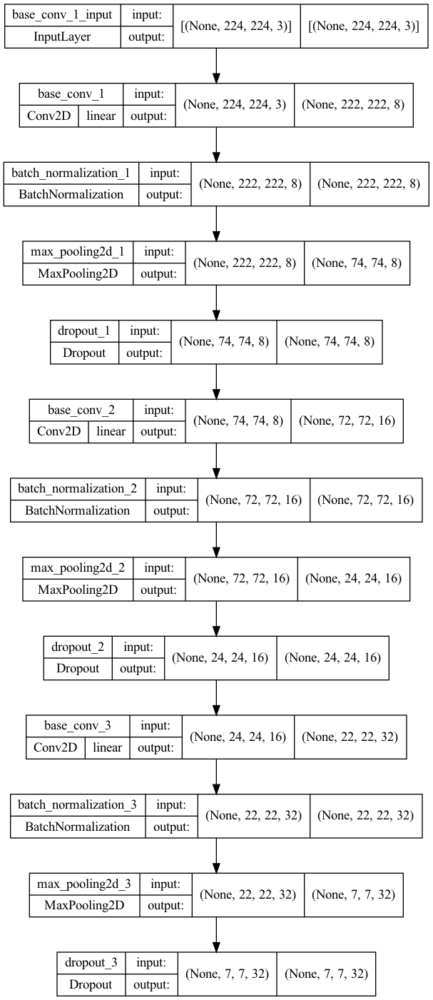

In [30]:
cnn_hypermodel = HyperCNN(
    input_shape=train_generator.image_shape)
cnn_hypermodel.build()
cnn_hypermodel.plot()

Everything looks in order, however these layers are the base layers of our model. In the next part, in order to make predictions, we will develop a *HyperTop* class which will build the *Flatten layer* and *Fully Connected layers* on top of this model.

## Hypermodel Generation: the *HyperTop class*

### *Class*

We create a *HyperTop* class which alse inheritates from the *CustomHyperModel* class. 

This *class* takes as *inputs*:
* The transfer learning *base_model*: an already trained model for *image classification*, of which the *layers* aren't *trainable* and the *top layer* not included,
* The *output shape*: the number of *classes* to predict,
* An optionnal *hyperparameter space*: a *dictionary* containing the *hyperparameters lists* to be tried.

This *class*:
* Creates the *top layers* which we will train to *predict* classes for our specific application,
* Concats the *top layers* to the *base model*,
* Compiles the final model,
* Can be passed as a *hypermodel* to the *KerasTuner tuners*.

In [31]:
class HyperTop(CustomHyperModel):

    def __init__(self, base_model, output_shape, *args, **kwargs):

        # Inits the instance with the default hyperparameters
        self.base_model = base_model
        self.params = dict(
            output_shape=output_shape,
            metrics=[
                'categorical_accuracy',
                tf.keras.metrics.AUC()])
        self.default_hyperparams = dict(
            drop_out=[0.],
            extra_layer=[True],
            layer_span=[64, 32],
            first_layers_activation=['relu'],
            output_activation=['softmax'],
            optimizer=['adam'],
            learning_rate = [1e-5])
        self.layers = 2
        self.hyperparams = copy.deepcopy(self.default_hyperparams)
        self.final_model = None

        self.update_hyperparams(*args, **kwargs)
    
    def filter_lower_x(self, l, n):

        # Filter list values to form neural funnel
        return [x for x in l if x < n]

    def build(self, hp=kt.HyperParameters()):
        
        # Get params
        params = self.params
        hyperparams = self.hyperparams

        layer_spans = self.compute_combinations(
            hyperparams.get('layer_span'),
            self.filter_lower_x,
            self.layers,
            -1)
        span = hp.Choice(
            name='layer_span',
            values=range(len(layer_spans)),
            default=0)
        layer_1_units = layer_spans[span][0]
        layer_2_units = layer_spans[span][1]
        first_layers_activation = hp.Choice(
                name='first_layers_activation',
                values=hyperparams.get('first_layers_activation'),
                default='relu')
        extra_layer = hp.Boolean(
            name='extra_layer',
            default=True)
        drop_out = hp.Choice(
                name='drop_out_top',
                values=hyperparams.get('drop_out'),
                default=0)
        optimizer = hp.Choice(
                name='optimizer',
                values=hyperparams.get('optimizer'),
                default='adam')

        # Build the model if it is a KerasTuner hypermodel
        if isinstance(self.base_model, kt.HyperModel):
            base_model = self.base_model.build(hp)
            self.base_model = base_model
        base_model = self.base_model

        # Build the top layers
        model = models.Sequential(name='TopLayer')
        ## Flatten layer
        model.add(layers.Flatten(name='top_flatten'))
        ## Dense layer 1
        model.add(layers.Dense(
            name='top_dense_1',
            units=layer_1_units,
            activation=first_layers_activation))
        ## Dropout 1
        model.add(layers.Dropout(drop_out))
        if extra_layer:
            ## Dense layer 2
            model.add(layers.Dense(
                name='top_dense_2',
                units=layer_2_units,
                activation=first_layers_activation))
            ## Dropout 1
            model.add(layers.Dropout(drop_out))
        ## Output layer
        model.add(layers.Dense(
            name='output',
            units=params.get('output_shape'),
            activation=hp.Choice(
                name='layer_3_activation',
                values=hyperparams.get('output_activation'),
                default='softmax')))

        # Concat the top layers to the base model
        final_model = tf.keras.Model(
            inputs=base_model.inputs,
            outputs=model(base_model(base_model.inputs)))
        
        # Compile the final model
        final_model.compile(
            optimizer=optimizer,
            loss='categorical_crossentropy',
            metrics=params.get('metrics'))
        
        # Sets learning rate
        K.set_value(
            final_model.optimizer.learning_rate,
            hp.Choice(
                name='learning_rate',
                values=hyperparams.get('learning_rate'),
                default=1e-5))
        if optimizer == 'sgd':
            K.set_value(
                final_model.optimizer.momentum,
                0.9)

        # Saving attributes
        self.top_layers = model
        self.final_model = final_model

        return final_model

### *Use*

* Initialize an *instance* of our *class* with its *default hyperparameters* and build the *base CNN* model:

In [32]:
cnn_final_hypermodel = HyperTop(
    base_model=cnn_hypermodel,
    output_shape=N_CLASSES)
# We build the default model
cnn_final_model = cnn_final_hypermodel.build()
cnn_final_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 base_conv_1_input (InputLay  [(None, 224, 224, 3)]    0         
 er)                                                             
                                                                 
 CNN (Sequential)            (None, 7, 7, 32)          6200      
                                                                 
 TopLayer (Sequential)       (None, 3)                 102595    
                                                                 
Total params: 108,795
Trainable params: 108,683
Non-trainable params: 112
_________________________________________________________________


* Plot the *models structure*:

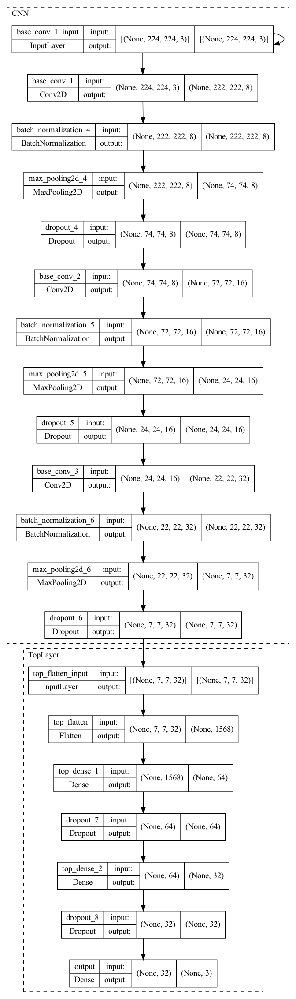

In [33]:
cnn_final_hypermodel.plot()

* Print the *default hyperparameters* of the *hypermodel*:

In [34]:
cnn_final_hypermodel.default_hyperparams

{'drop_out': [0.0],
 'extra_layer': [True],
 'layer_span': [64, 32],
 'first_layers_activation': ['relu'],
 'output_activation': ['softmax'],
 'optimizer': ['adam'],
 'learning_rate': [1e-05]}

* Update the *hyperparameters space* of the *hypermodel* by passing arguments to the *class*:

In [35]:
cnn_final_hypermodel.update_hyperparams(layer_span=128)
cnn_final_hypermodel.hyperparams

{'drop_out': [0.0],
 'extra_layer': [True],
 'layer_span': [64, 32, 128],
 'first_layers_activation': ['relu'],
 'output_activation': ['softmax'],
 'optimizer': ['adam'],
 'learning_rate': [1e-05]}

* Initialize the *tuner* with our *final hypermodel*:

In [36]:
# We create a KerasTuner RandomSearch instance
tuner = kt.RandomSearch(
    hypermodel=cnn_final_hypermodel,
    objective='val_loss',
    max_trials=2)

* Launch *training*:

In [37]:
# Forces the use of the GPU for training
with tf.device('/device:GPU:0'):
    # We apply the search method of the KerasTuner instance
    tuner.search(
        train_generator,
        validation_data=val_generator,
        steps_per_epoch=steps_per_epoch,
        validation_steps=validation_steps,
        verbose=1,
        epochs=3)

Trial 2 Complete [00h 00m 07s]
val_loss: 1.0883419513702393

Best val_loss So Far: 1.0698026418685913
Total elapsed time: 00h 00m 15s
INFO:tensorflow:Oracle triggered exit


## Evaluation: the *PerformanceReport class*

### *Class*

In order to track our experiments results, we create a *class* which will ingest performance summaries of *KerasTuner* and output a performance report in the form of a *Pandas DataFrame*:

We will track the following metrics:
* The score (the *Categorical Crossestropy* loss),
* The *Categorical Accuracy*,
* The *F1 score*,

On both the training and validation sets.

We will also save the best *hyperparameters dictionnaries* as well as the *best models* of each run.

In [38]:
class PerformanceReport():

    def __init__(self):

        # Initiliaze the report DataFrame
        self.report = pd.DataFrame(
            columns=[
                'algorithm',
                'search',
                'n_classes',
                'train_score',
                'val_score',
                'val_accuracy',
                'val_auc',
                'hyperparameters',
                'tuner',
                'model']
                ).set_index(['algorithm','search'])

    def update(self, model_name, tuner_name, tuner, results, n_classes):
        
        # Get values from the Oracle
        best_trial = tuner.oracle.get_best_trials(1)[0]
        best_epoch = np.argmax(np.array(best_trial.metrics.get_history('val_loss')))
        train_score = best_trial.metrics.get_history('loss')[best_epoch].value[0]
        val_score = best_trial.metrics.get_history('val_loss')[best_epoch].value[0]
        params = best_trial.hyperparameters.values
        model = tuner.get_best_models(1)[0]

        # Set values in the report dataframe
        self.report.loc[(model_name, tuner_name),:] = [
            n_classes,
            train_score,
            val_score,
            results.get('categorical_accuracy'),
            results.get('auc'),
            params,
            tuner,
            model]

    def get(self):
        
        # Get the report dataframe
        return self.report

### *Use*

* Create a *PerformanceReport instance* to which the performances will be added:

In [39]:
report = PerformanceReport()
report.get()

,,n_classes,train_score,val_score,val_accuracy,val_auc,hyperparameters,tuner,model
algorithm,search,,,,,,,,


## Hyperparameters Search: the *HyperSearch class*

### *Class*

We develop a *HyperSearch class* in order to wrap the *KerasTuner tuners*, facilitate the generation of *logs* to be read by *Tensorboard* & save the results to the *PerformanceReport* instance we initialized during our test.

In order to improve our optimization and follow our experiments, we are implementing *callbacks*:
* *Tensorboard*: the *TensorFlow experiments visualization library*,
* *Early Stopping*: to stop the model training if the score is not improving.

In [40]:
class HyperSearch():
    
    def __init__(self, train_data, val_data, train_datagen, val_datagen, generator_settings, report=None):
        
        # Seeding
        self.seed = 333
        # Store settings
        self.batch_size = generator_settings.get('batch_size')
        del generator_settings['batch_size']
        self.generator_settings = generator_settings
        # Store the training and validation datasets for creating generators
        self.train_data_original = train_data
        self.val_data_original = val_data
        # Store the datagens for creating generators
        self.train_datagen = train_datagen
        self.val_datagen = val_datagen
        # We will update our PerformanceReport
        if report == None: self.report = PerformanceReport()
        if report != None: self.report = report

    def get_n_classes(self, n_classes):

        return get_n_classes(
            self.train_data_original,
            self.val_data_original,
            n_classes)

    def gen_datasets(self, n_classes):    
        
        # Get filtered n classes datasets
        self.train_data, self.val_data = self.get_n_classes(n_classes)
        # Initialize generators
        print('Training:\n')
        self.train_generator = self.train_datagen.flow_from_dataframe(
            dataframe=self.train_data,
            batch_size=self.batch_size,
            **self.generator_settings,
            seed=self.seed)
        print('\nValidation:\n')
        self.val_generator = self.val_datagen.flow_from_dataframe(
            dataframe=self.val_data,
            batch_size=self.batch_size,
            **self.generator_settings,
            seed=self.seed)
        # Set steps_per_epochs & validation_steps for fitting
        self.steps_per_epoch = self.train_generator.samples // self.batch_size
        self.validation_steps = self.val_generator.samples // self.batch_size
        # Transform the generators to TensorFlow Datasets
        target_size = self.generator_settings.get('target_size')
        output_types = (tf.float32, tf.float32)
        output_shapes = (
            [None, target_size[0], target_size[1], 3],
            [None, n_classes])
        self.train_dataset = tf.data.Dataset.from_generator(
            lambda: self.train_generator,
            output_types=output_types,
            output_shapes=output_shapes).repeat()
        # We use the repeat method to iterate other the Datasets
        self.val_dataset = tf.data.Dataset.from_generator(
            lambda: self.val_generator,
            output_types=output_types,
            output_shapes=output_shapes)

    def gen_callbacks(self, log_path):

        # Set up Tensorboard
        tensorboard = tf.keras.callbacks.TensorBoard(f'{log_path}/tensorboard')
        # Set up the early stopping
        early_stopping = EarlyStopping(
            monitor='val_loss',
            mode='min',
            patience=10,
            restore_best_weights=True)

        # Reduce learning rate on plateau
        reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            mode='min',
            min_delta=0.00001,
            factor=0.1,
            patience=5,
            min_lr=4e-05,
            verbose=1)

        # Store callbacks
        self.callbacks = [tensorboard, early_stopping, reduce_lr]

    def experiment_warmup(self, model_name, hypermodel):

        # Generate TensorBoard log_path and generate callbacks
        self.log_path = model_name + '_log'
        self.gen_callbacks(self.log_path)
        # Save output_shape
        self.n_classes = hypermodel.params.get('output_shape')
        # Gen generators
        self.gen_datasets(self.n_classes)

    def experiment_cooldown(self, tuner, model_name, tuner_name, hypermodel):
        
        # Get best epoch scores from history
        results = self.get_best_epoch_metrics(tuner)

        # Update report
        self.report.update(
            model_name,
            tuner_name,
            tuner,
            results,
            hypermodel.params.get('output_shape'))

        # Predict val set with the best model
        self.best_model = tuner.get_best_models(1)[0]
        train_df, val_df = self.get_n_classes(self.n_classes)
        val_df['labels'] = val_df['labels'].astype(str)
        # Gen new val generator
        val_generator = self.val_datagen.flow_from_dataframe(
            shuffle=False,
            dataframe=val_df,
            batch_size=self.batch_size,
            **self.generator_settings)
        # Predict on val data
        self.predictions = self.best_model.predict(val_generator)
        # Compute confusion matrix
        y_true = np.array(val_generator.classes)
        y_pred = self.predictions.argmax(axis=1)
        self.confusion_matrix = confusion_matrix(
            y_true,
            y_pred)
        # Compute classification report
        self.classification_report = classification_report(
            y_true,
            y_pred)
        # Generate labels indices
        self.gen_indices()

    def random_search(self, model_name, hypermodel, max_trials, hyperparams=dict()):

        tuner_name = 'random_search'

        # Prepare experiment
        self.experiment_warmup(model_name, hypermodel)

        # Prepare the tuner
        tuner = kt.RandomSearch(
            hypermodel=hypermodel,
            objective='val_loss',
            overwrite=True,
            project_name='kerastuner',
            directory=self.log_path,
            max_trials=max_trials,
            seed=self.seed)

        # Search using the tuner
        tuner = self.search(tuner, hyperparams)

        # Finalize experiment
        self.experiment_cooldown(tuner,
            model_name,
            tuner_name,
            hypermodel)

        return tuner

    def hyperband(self, model_name, hypermodel, max_epochs, factor, hyperband_iterations, hyperparams=dict()):
        
        tuner_name = 'hyperband'

        # Prepare experiment
        self.experiment_warmup(model_name, hypermodel)

        # Prepare the tuner
        tuner = kt.Hyperband(
            hypermodel=hypermodel,
            objective='val_loss',
            overwrite=True,
            directory=self.log_path,
            max_epochs=max_epochs,
            factor=factor,
            hyperband_iterations=hyperband_iterations,
            seed=self.seed)

        # Search using the tuner
        tuner = self.search(tuner, hyperparams)

        # Finalize experiment
        self.experiment_cooldown(
            tuner,
            model_name,
            tuner_name,
            hypermodel)

        return tuner


    def search(self, tuner, hyparameters):

        # Fit the tuner using the hyperparameters
        with tf.device('/device:GPU:0'):
            tuner.search(
                self.train_dataset,
                validation_data=self.val_dataset,
                steps_per_epoch=self.steps_per_epoch,
                validation_steps=self.validation_steps,
                callbacks=self.callbacks,
                verbose=1,
                **hyparameters)
        
        return tuner
        
    def get_best_epoch_metrics(self, tuner):

        # Read the best history using Tensorflows summary_iterator

        # Selects the objectives dataset
        objective = tuner.oracle.objective.name
        if objective.startswith('val_'): dataset = 'validation'
        else: dataset = 'train'
        # Get the best trial id
        best_trial = tuner.oracle.get_best_trials()[0].trial_id
        # Computes event file path
        trial_path = f'./{self.log_path}/tensorboard/{best_trial}/execution0/{dataset}'
        events_file_path = f'{trial_path}/{os.listdir(trial_path)[0]}'
        # Generate the summary_iterator
        iterator = summary_iterator(events_file_path)

        # Get best epoch
        epoch = 0
        best_epoch = 0
        best_score = 999

        for e in iterator:
            for v in e.summary.value:
                if v.tag == 'epoch_loss':
                    value = tf.make_ndarray(v.tensor).tolist()
                    if value < best_score:
                        best_score = value
                        best_epoch = epoch
                    else: continue
                    epoch += 1
        # Reset the iterator
        iterator = summary_iterator(events_file_path)
        # Iterate over best epoch to obtain best metrics
        results = dict()
        metrics = ['categorical_accuracy', 'auc']
        scored = 0
        epoch = 0

        for e in iterator:
            for v in e.summary.value:
                for metric in metrics:
                    if v.tag == f'epoch_{metric}':
                        if scored == len(metrics):
                            break
                        if epoch != best_epoch:
                            epoch += 1
                            continue
                        if epoch == best_epoch:
                            results[metric] = tf.make_ndarray(v.tensor).tolist()
                            scored += 1
        
        return results

    def gen_indices(self):
        
        # Get indices fro generator and save to disk
        indices = self.val_generator.class_indices
        self.labels_map = pd.DataFrame(index=indices.values(), data=indices.keys(), columns=['label'])
        self.labels_map.to_csv('./labels.csv')

### *Use*

* The use of this class is explicited in the next part of this *notebook*.

# Model Training

* Create a blank *PerformanceReport*:

In [41]:
# Initialze an instance of PerformanceReport()
report = PerformanceReport()
report.get()

,,n_classes,train_score,val_score,val_accuracy,val_auc,hyperparameters,tuner,model
algorithm,search,,,,,,,,


## CNN

* Initialize a *HyperCNN instance* to generate the *base model* and a *HyperTop* instance to *concatenate* the *top layers* to its *base layers*:

In [42]:
cnn_hypermodel = HyperCNN(
    input_shape=train_generator.image_shape,
    kernel_dim=[6, 12, 24],
    filters_span=[128, 256],
    drop_out=[0.2, 0.4])
hypermodel = HyperTop(
    base_model=cnn_hypermodel,
    output_shape=N_CLASSES)

* Show the *cnn_hypermodel default hyperparameters*:

In [43]:
cnn_hypermodel.default_hyperparams

{'drop_out': [0.0], 'filters_span': [8, 16, 32], 'kernel_dim': [3]}

* Show the *cnn_hypermodel hyperparameters*:

In [44]:
cnn_hypermodel.hyperparams

{'drop_out': [0.0, 0.4, 0.2],
 'filters_span': [32, 128, 256, 8, 16],
 'kernel_dim': [24, 3, 12, 6]}

* Show the *final hypermodel default hyperparameters*:

In [45]:
hypermodel.default_hyperparams

{'drop_out': [0.0],
 'extra_layer': [True],
 'layer_span': [64, 32],
 'first_layers_activation': ['relu'],
 'output_activation': ['softmax'],
 'optimizer': ['adam'],
 'learning_rate': [1e-05]}

* Create a *dictionary* for the *hyperparameters search space*:

In [46]:
hypertop_hyperparams = dict(
    drop_out=[0.4, 0.6],
    layer_span=[128, 256, 512],
    first_layers_activation='tanh',
    output_activation='sigmoid',
    optimizer='sgd',
    learning_rate=1e-3)

* Add extra *hyperparameter Choices* to the *final hypermodel*:

In [47]:
hypermodel.update_hyperparams(**hypertop_hyperparams)
hypermodel.hyperparams

{'drop_out': [0.0, 0.4, 0.6],
 'extra_layer': [True],
 'layer_span': [64, 256, 32, 128, 512],
 'first_layers_activation': ['relu', 'tanh'],
 'output_activation': ['softmax', 'sigmoid'],
 'optimizer': ['sgd', 'adam'],
 'learning_rate': [1e-05, 0.001]}

* Initiliaze and *HyperSearch instance* with the *training*, the *test data* & the *report*:

In [48]:
# Initialize an instance of HyperSearch()
search = HyperSearch(
    train_data=train_df_init,
    val_data=val_df_init,
    train_datagen=train_datagen,
    val_datagen=val_datagen,
    generator_settings=generator_settings,
    report=report)

* Apply a *random search* by passing the *model name*, *hypermodel* and *optional fit parameters*:

In [49]:
# The random_search method launches an instance of kt.RandomSearch()
tuner = search.random_search(
    model_name='cnn',
    hypermodel=hypermodel,
    max_trials=50,
    hyperparams=dict(
        epochs=50))

Trial 50 Complete [00h 02m 00s]
val_loss: 0.9317048192024231

Best val_loss So Far: 0.7547389268875122
Total elapsed time: 01h 05m 55s
INFO:tensorflow:Oracle triggered exit
Instructions for updating:
Use eager execution and: 
`tf.data.TFRecordDataset(path)`
Found 289 validated image filenames belonging to 3 classes.


2022-05-21 02:26:49.281980: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


* Use the *KerasTuner tuner* and list the best runs:

In [50]:
tuner.results_summary(1)

Results summary
Results in cnn_log/kerastuner
Showing 1 best trials
Objective(name='val_loss', direction='min')
Trial summary
Hyperparameters:
layer_span: 0
first_layers_activation: relu
extra_layer: False
drop_out_top: 0.0
optimizer: adam
filter_span: 2
kernel_dim: 6
drop_out_cnn: 0.0
layer_3_activation: sigmoid
learning_rate: 0.001
Score: 0.7547389268875122


***Please note that Tensorboad runs on a web server and will not be saved as an output of the notebook. If running this notebook, the Tensorboard app might not appear at the first execution of the following cell. In that case, execute the following cell a second time.***

*Tensorboard* can be used to vizualize the logs:

<img src='https://i.ibb.co/DfKTgpK/cnn-log.png'>

In [94]:
%tensorboard --logdir cnn_log

Reusing TensorBoard on port 6006 (pid 4110), started 2 days, 10:48:37 ago. (Use '!kill 4110' to kill it.)

In [52]:
search.classification_report

'              precision    recall  f1-score   support\n\n           0       0.61      0.21      0.31        52\n           1       0.70      0.49      0.58        85\n           2       0.64      0.89      0.75       152\n\n    accuracy                           0.65       289\n   macro avg       0.65      0.53      0.55       289\nweighted avg       0.65      0.65      0.62       289\n'

* Print the *report*:

In [53]:
report.get()

,,n_classes,train_score,val_score,val_accuracy,val_auc,hyperparameters,tuner,model
algorithm,search,,,,,,,,
cnn,random_search,3,0.549178,0.754739,0.564444,0.796504,"{'layer_span': 0, 'first_layers_activation': '...",<keras_tuner.tuners.randomsearch.RandomSearch ...,<keras.engine.functional.Functional object at ...


## Inference

We are now going to *infer (predict)* on samples images from the *validation dataset* to insure everything is working correctly. In this part we will: 
* get the best *model (and labels)* from the tuner,
* select random *sample images* from the *dataset*,
* predict their *classes*,
* visualize the *predictions*.

* Load the *best model* for *inference (prediction)*:


In [54]:
best_model = search.best_model

* Get the labels map to inverse *model outputs*

In [55]:
labels_df = search.labels_map
labels_df

,label
0,Chihuahua
1,Japanese spaniel
2,Maltese dog


* Get a *sample* from the *validation dataset*:

In [56]:
sample, sample_img, sample_path = get_sample(search.val_data)
sample

,file_list,annotation_list,labels,label,Set
194,n02085936-Maltese_dog/n02085936_4921.jpg,n02085936-Maltese_dog/n02085936_4921,3,Maltese dog,Validation


* Show the *sample image*:

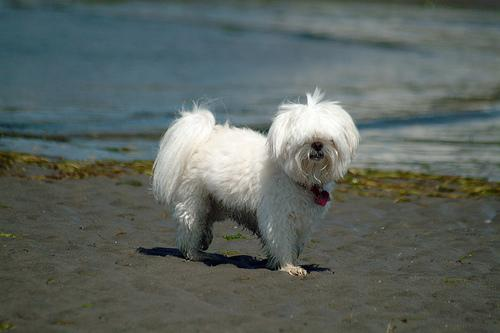

In [57]:
sample_img

* Preprocess the *sample image* for *prediction*:

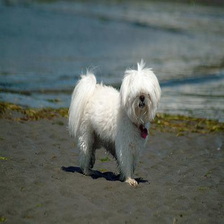

In [58]:
def preprocess_image(img):

    # Resize image
    img = img.resize((224, 224), Image.LANCZOS)
    img = img.convert('RGB')
    img_tensor = image.img_to_array(img)
    # Generate tensors
    img_tensor = np.expand_dims(img_tensor, axis=0)
    img_tensor = preprocess_input(img_tensor)

    return img_tensor, img

sample_x, sample_img = preprocess_image(sample_img)
sample_img

* Infer *(predict)* on the preprocessed image:

In [59]:
def get_prediction(model, labels, img_tensor):

    prediction = model.predict(img_tensor)
    label = labels.loc[np.argmax(prediction), 'label']
    probability = str(prediction.max() * 100)[:5]

    return label, probability

prediction = get_prediction(best_model, labels_df, sample_x)
prediction

2022-05-21 02:28:07.423741: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


('Maltese dog', '93.46')

* ***To wrap it up***, visualize the *random samples*:

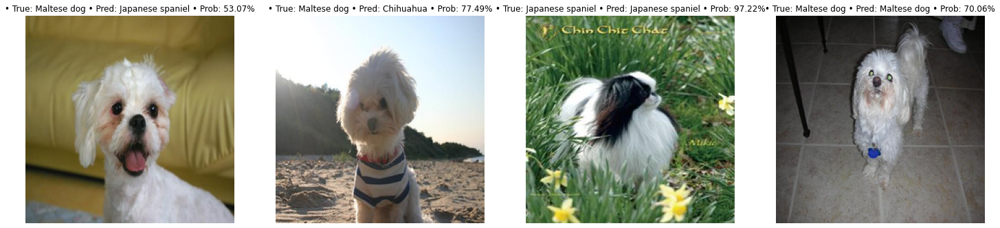

In [60]:
def show_sample_predictions(model, labels, dataframe, n=4):

    i = 0
    plt.figure(figsize=(25,25))
    plt.subplot(1,4,1)
    plt.title('Original')
    plt.axis('off')

    for _ in range(n):
        # Get sample image for each index
        sample, sample_img, sample_path = get_sample(dataframe)
        file = sample.file_list.values[0]
        label_true = file.split('/')[0].split('-')[1].replace('_', ' ').capitalize()
        # Drop the row from dataframe to obtain unique samples
        dataframe = dataframe.drop(sample.index, axis=0)
        # Preprocess image
        sample_x, sample_img = preprocess_image(sample_img)
        # Get prediction
        prediction = get_prediction(model, labels, sample_x)
        # Plot image
        plt.subplot(1,4,(i-1)+2)
        plt.title(f'• True: {label_true} • Pred: {prediction[0]} • Prob: {prediction[1]}%')
        plt.imshow(sample_img)
        plt.axis('off')
        i += 1
        
show_sample_predictions(best_model, labels_df, search.val_data)
    

## VGG16 *(Transfer Learning)*

We are importing the VGG16 but we do not include its top layer. We will use the VGG16 as a base model, rendering it non trainable:

In [61]:
# Load the VGG16 model
base_vgg = VGG16(
    weights="imagenet",
    include_top=False, 
    input_shape=train_generator.image_shape)
base_vgg.trainable = False
base_vgg.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

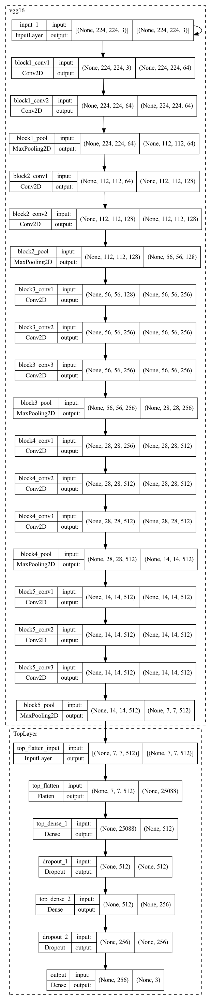

In [62]:
hypermodel = HyperTop(
    base_model=base_vgg,
    output_shape=N_CLASSES,
    **hypertop_hyperparams)
hypermodel.build()
hypermodel.plot()

In [63]:
# The random_search method launches an instance of kt.RandomSearch()
tuner = search.random_search(
    model_name='vgg',
    hypermodel=hypermodel,
    max_trials=50,
    hyperparams=dict(
        epochs=50))

Trial 50 Complete [00h 03m 39s]
val_loss: 1.0142124891281128

Best val_loss So Far: 0.3447144329547882
Total elapsed time: 06h 17m 38s
INFO:tensorflow:Oracle triggered exit
Found 289 validated image filenames belonging to 3 classes.


2022-05-21 08:45:48.985823: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


* *Tensorboard* can be used to vizualize the impact of the hyperparameters:

<img src='https://i.ibb.co/gvLwyMJ/vgg-log.png'>

* Show the *Tensorboard panel*:

In [93]:
%tensorboard --logdir vgg_log

Reusing TensorBoard on port 6007 (pid 9070), started 2 days, 4:29:22 ago. (Use '!kill 9070' to kill it.)

In [65]:
search.classification_report

'              precision    recall  f1-score   support\n\n           0       0.83      0.75      0.79        52\n           1       0.97      0.73      0.83        85\n           2       0.81      0.95      0.87       152\n\n    accuracy                           0.85       289\n   macro avg       0.87      0.81      0.83       289\nweighted avg       0.86      0.85      0.85       289\n'

In [66]:
report.get()

,,n_classes,train_score,val_score,val_accuracy,val_auc,hyperparameters,tuner,model
algorithm,search,,,,,,,,
cnn,random_search,3,0.549178,0.754739,0.564444,0.796504,"{'layer_span': 0, 'first_layers_activation': '...",<keras_tuner.tuners.randomsearch.RandomSearch ...,<keras.engine.functional.Functional object at ...
vgg,random_search,3,0.089822,0.344714,0.777778,0.923002,"{'layer_span': 1, 'first_layers_activation': '...",<keras_tuner.tuners.randomsearch.RandomSearch ...,<keras.engine.functional.Functional object at ...


2022-05-21 08:46:02.034479: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


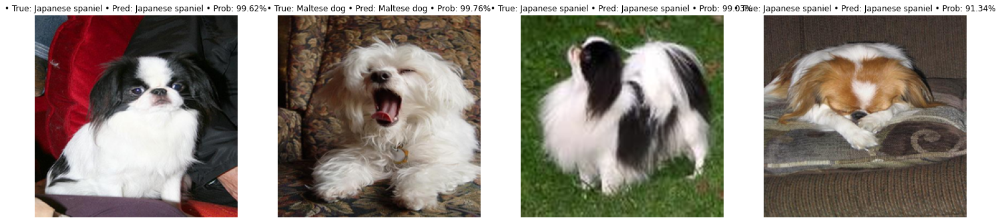

In [67]:
show_sample_predictions(search.best_model, labels_df, search.val_data)

## InceptionV3 (Transfer Learning)

In [68]:
# Load the Inception model
base_inception = InceptionV3(
    weights="imagenet",
    include_top=False, 
    input_shape=train_generator.image_shape)
base_inception.trainable = False

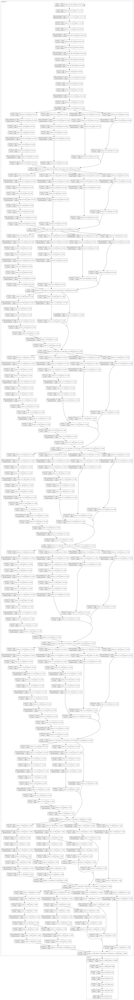

In [69]:
hypermodel = HyperTop(
    base_model=base_inception,
    output_shape=N_CLASSES,
    **hypertop_hyperparams)
hypermodel.build()
hypermodel.plot()

In [70]:
# The random_search method launches an instance of kt.RandomSearch()
tuner = search.random_search(
    model_name='inception',
    hypermodel=hypermodel,
    max_trials=25,
    hyperparams=dict(
        epochs=25))

Trial 25 Complete [00h 02m 29s]
val_loss: 0.0224124975502491

Best val_loss So Far: 1.6195399155094492e-07
Total elapsed time: 00h 57m 40s
INFO:tensorflow:Oracle triggered exit


Found 289 validated image filenames belonging to 3 classes.


2022-05-21 09:43:53.051124: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


* As you can see, the tuning of this model for predicting has been stopped by the *Oracle* prematurely. This is because the model at this point has already reached a near than perfect loss.

In [92]:
%tensorboard --logdir inception_log

Reusing TensorBoard on port 6008 (pid 9697), started 2 days, 3:28:08 ago. (Use '!kill 9697' to kill it.)

In [72]:
search.classification_report

'              precision    recall  f1-score   support\n\n           0       0.98      1.00      0.99        52\n           1       0.99      1.00      0.99        85\n           2       1.00      0.99      0.99       152\n\n    accuracy                           0.99       289\n   macro avg       0.99      1.00      0.99       289\nweighted avg       0.99      0.99      0.99       289\n'

In [73]:
tuner.results_summary(3)

Results summary
Results in inception_log/kerastuner
Showing 3 best trials
Objective(name='val_loss', direction='min')
Trial summary
Hyperparameters:
layer_span: 1
first_layers_activation: relu
extra_layer: False
drop_out_top: 0.6
optimizer: adam
layer_3_activation: sigmoid
learning_rate: 0.001
Score: 1.6195399155094492e-07
Trial summary
Hyperparameters:
layer_span: 2
first_layers_activation: relu
extra_layer: False
drop_out_top: 0.6
optimizer: adam
layer_3_activation: softmax
learning_rate: 0.001
Score: 5.148741365701426e-06
Trial summary
Hyperparameters:
layer_span: 1
first_layers_activation: relu
extra_layer: False
drop_out_top: 0.4
optimizer: adam
layer_3_activation: softmax
learning_rate: 0.001
Score: 8.063485438469797e-06


In [74]:
report.get()

,,n_classes,train_score,val_score,val_accuracy,val_auc,hyperparameters,tuner,model
algorithm,search,,,,,,,,
cnn,random_search,3,0.549178,0.754739,0.564444,0.796504,"{'layer_span': 0, 'first_layers_activation': '...",<keras_tuner.tuners.randomsearch.RandomSearch ...,<keras.engine.functional.Functional object at ...
vgg,random_search,3,0.089822,0.344714,0.777778,0.923002,"{'layer_span': 1, 'first_layers_activation': '...",<keras_tuner.tuners.randomsearch.RandomSearch ...,<keras.engine.functional.Functional object at ...
inception,random_search,3,0.164762,0.0,1.0,0.99883,"{'layer_span': 1, 'first_layers_activation': '...",<keras_tuner.tuners.randomsearch.RandomSearch ...,<keras.engine.functional.Functional object at ...


2022-05-21 09:45:12.086889: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


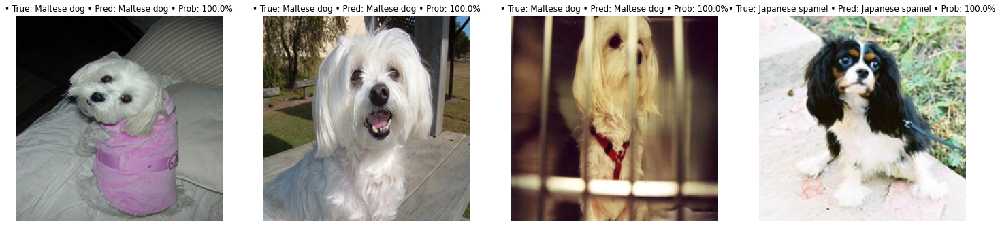

In [75]:
show_sample_predictions(search.best_model, labels_df, search.val_data)

## InceptionV3 (120 classes)

For our demo app *(POC)*, we will train a model on the whole 120 classes. Being limited in computing ressources, we will only apply a very sparse *random search*.

In [76]:
N_CLASSES = 120

In [77]:
base_inception = InceptionV3(
    weights="imagenet",
    include_top=False, 
    input_shape=train_generator.image_shape)
base_inception.trainable = False

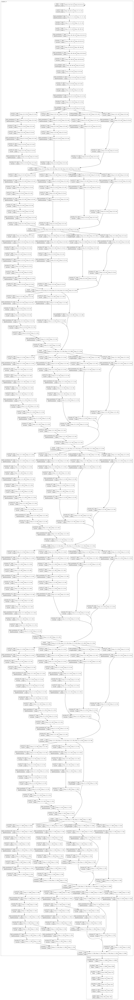

In [78]:
hypermodel = HyperTop(
    base_model=base_inception,
    output_shape=N_CLASSES,
    **hypertop_hyperparams)
hypermodel.build()
hypermodel.plot()

In [79]:
# The random_search method launches an instance of kt.RandomSearch()
tuner = search.random_search(
    model_name='inception_120',
    hypermodel=hypermodel,
    max_trials=25,
    hyperparams=dict(
        epochs=25))

Trial 25 Complete [01h 51m 11s]
val_loss: 1.5401041507720947

Best val_loss So Far: 0.7762550115585327
Total elapsed time: 01h 08m 36s
INFO:tensorflow:Oracle triggered exit
Found 8580 validated image filenames belonging to 120 classes.


2022-05-23 10:54:05.368721: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


In [80]:
%tensorboard --logdir inception_log_120

Reusing TensorBoard on port 6008 (pid 9697), started 2 days, 1:10:17 ago. (Use '!kill 9697' to kill it.)

In [81]:
tuner.results_summary(1)

Results summary
Results in inception_120_log/kerastuner
Showing 1 best trials
Objective(name='val_loss', direction='min')
Trial summary
Hyperparameters:
layer_span: 0
first_layers_activation: tanh
extra_layer: False
drop_out_top: 0.0
optimizer: adam
layer_3_activation: sigmoid
learning_rate: 0.001
Score: 0.7762550115585327


In [82]:
report.get()

,,n_classes,train_score,val_score,val_accuracy,val_auc,hyperparameters,tuner,model
algorithm,search,,,,,,,,
cnn,random_search,3,0.549178,0.754739,0.564444,0.796504,"{'layer_span': 0, 'first_layers_activation': '...",<keras_tuner.tuners.randomsearch.RandomSearch ...,<keras.engine.functional.Functional object at ...
vgg,random_search,3,0.089822,0.344714,0.777778,0.923002,"{'layer_span': 1, 'first_layers_activation': '...",<keras_tuner.tuners.randomsearch.RandomSearch ...,<keras.engine.functional.Functional object at ...
inception,random_search,3,0.164762,0.0,1.0,0.99883,"{'layer_span': 1, 'first_layers_activation': '...",<keras_tuner.tuners.randomsearch.RandomSearch ...,<keras.engine.functional.Functional object at ...
inception_120,random_search,120,1.118594,0.776255,0.726985,0.980366,"{'layer_span': 0, 'first_layers_activation': '...",<keras_tuner.tuners.randomsearch.RandomSearch ...,<keras.engine.functional.Functional object at ...


In [83]:
labels_df = search.labels_map

2022-05-23 10:55:29.278959: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


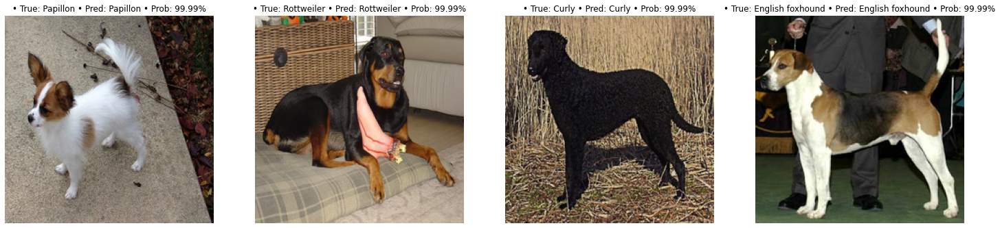

In [84]:
show_sample_predictions(search.best_model, labels_df, search.val_data)

# Application

We are now going to *infer (predict)* on samples images from the *validation dataset* to insure everything is working correctly. In this part we will: 
* save the best *model* on disk, 
* load the best *model (and labels)* from disk,
* select random *sample images* from the *dataset*,
* predict their *classes*.

***We will use the functions developed in this part in our app.***

* Save the best *test model* to disk:

In [85]:
tf.keras.models.save_model(search.best_model, 'test_model.h5')

* Load the best *model and labels* from disk:

In [86]:
def prep_model(model_path, labels_path):

    model = tf.keras.models.load_model(model_path, compile=False)
    labels = pd.read_csv(labels_path, index_col=0)

    return model, labels
    
test_model, labels = prep_model('./test_model.h5', './labels.csv')
labels

,label
0,Affenpinscher
1,Afghan hound
2,African hunting dog
3,Airedale
4,American staffordshire terrier
...,...
115,Welsh springer spaniel
116,West highland white terrier
117,Whippet
118,Wire


* Get a *sample* from the *validation dataset*:

In [87]:
search.val_data

,file_list,annotation_list,labels,label,Set
5994,n02107142-Doberman/n02107142_18214.jpg,n02107142-Doberman/n02107142_18214,86,Doberman,Validation
428,n02086240-Shih-Tzu/n02086240_3493.jpg,n02086240-Shih-Tzu/n02086240_3493,5,Shih,Validation
3072,n02095570-Lakeland_terrier/n02095570_1482.jpg,n02095570-Lakeland_terrier/n02095570_1482,39,Lakeland terrier,Validation
962,n02088238-basset/n02088238_7233.jpg,n02088238-basset/n02088238_7233,11,Basset,Validation
5330,n02104365-schipperke/n02104365_7377.jpg,n02104365-schipperke/n02104365_7377,73,Schipperke,Validation
...,...,...,...,...,...
1549,n02090721-Irish_wolfhound/n02090721_2540.jpg,n02090721-Irish_wolfhound/n02090721_2540,20,Irish wolfhound,Validation
14,n02085620-Chihuahua/n02085620_6295.jpg,n02085620-Chihuahua/n02085620_6295,1,Chihuahua,Validation
8462,n02115913-dhole/n02115913_2325.jpg,n02115913-dhole/n02115913_2325,119,Dhole,Validation
1645,n02091032-Italian_greyhound/n02091032_4970.jpg,n02091032-Italian_greyhound/n02091032_4970,21,Italian greyhound,Validation


In [88]:
sample, sample_img, sample_path = get_sample(search.val_data)
sample

,file_list,annotation_list,labels,label,Set
2007,n02091635-otterhound/n02091635_699.jpg,n02091635-otterhound/n02091635_699,25,Otterhound,Validation


* Show the *sample image*:

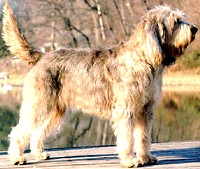

In [89]:
sample_img

* Preprocess the *sample image* for *prediction*:

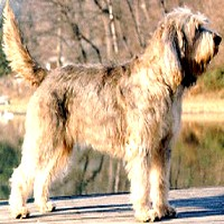

In [90]:
sample_x, sample_img = preprocess_image(sample_img)
sample_img

* Infer *(predict)* on the preprocessed image:

In [91]:
prediction = get_prediction(test_model, labels, sample_x)
prediction

2022-05-23 10:55:41.317507: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


('Otterhound', '99.99')

# Whatadog Predictor (app for the dog classifier)

The code for the app is available in the "P6_03_app" zip file or can be downloaded from the [git repository](https://github.com/thibaudgrosjean/Whatanapp
).
## Requirements:
* Python
* 450mb of free disk space

## How to use:
* Install requirements with "pip install -r requirements.txt"
* Launch the app with "streamlit run app.py"
* Open an image file using drag & drop or the explorer to obtain predictions